# **PnP Phase and ADD Evaluation**

In this phase, the **Perspective-n-Point (PnP)** algorithm was implemented together with the **RANSAC** method to robustly estimate the 6D pose of the object based on known 2D-3D correspondences. The resulting rotation and translation vectors represent the predicted position and orientation of the object in space.

After estimating the 6D pose, the **ADD (Average Distance of Model Points)** metric was applied to evaluate the accuracy of the predicted pose by comparing the predicted and ground truth poses.

For symmetric objects, where multiple poses may visually appear identical, the **ADD-Symmetric (ADD-S)** variation was used.

Additionally, a detailed analysis of the results was performed through **CDF (Cumulative Distribution Function)** curves and error distribution plots, providing further insight into the model's performance and the behavior of the pose estimation errors.


## **Importing modules**

In [ ]:
import os
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
from concurrent.futures import ProcessPoolExecutor, as_completed
from collections import defaultdict
from matplotlib.lines import Line2D
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Loading Data**

In [ ]:
BASE_DIR = "/content/drive/MyDrive/MLDL/6D-Pose-Estimation"

In [ ]:
IMG_DIR = os.path.join(BASE_DIR, "data/full_data/train/images")
IMG_CROPPED_DIR = os.path.join(BASE_DIR, "data/cropped_resized_data")

#------------DATA PATHS------------

#3D POINTS
KP3D_CPS_JSON = os.path.join(BASE_DIR, "data/point_sampling_data/3D_50_keypoints_cps.json")
KP3D_FPS_JSON = os.path.join(BASE_DIR, "data/point_sampling_data/3D_50_keypoints_fps.json")

# ------------PREDITIONS FROM BASELINE------------

#CPS pairs
KP2D_CPS_JSON = os.path.join(BASE_DIR, "data/predicted_key_points/baseline_cps_predictions.json")
#FPS pairs
KP2D_FPS_JSON = os.path.join(BASE_DIR, "data/predicted_key_points/baseline_fps_predictions.json")


#------------PREDICTIONS FROM EXTENDED ARCHITECUTRE------------

#CROSS FUSION with ReLU no schduller
KP2D_CROSS_FUSION_RELU_JSON = os.path.join(BASE_DIR, "data/predicted_key_points/extened_relu_predictions.json")

#CROSS FUSION with SiLU no schduller
KP2D_CROSS_FUSION_SILU_JSON = os.path.join(BASE_DIR, "data/predicted_key_points/extended_silu_predictions.json")

#CROSS FUSION with MiSh no schduller
KP2D_CROSS_FUSION_MISH_JSON = os.path.join(BASE_DIR, "data/predicted_key_points/extended_mish_predictions.json")


#------------PREDICTIONS WITH INTRODUCED SCHEDULLERS------------


#CROSS FUSION with ReLU and Cosine scheduller
KP2D_CROSS_FUSION_RELU_COS_JSON = os.path.join(BASE_DIR, "data/predicted_key_points/extended_relu_cos_predictions.json")

#CROSS FUSION with SiLu and Cosine scheduller
KP2D_CROSS_FUSION_SILU_COS_JSON = os.path.join(BASE_DIR, "data/predicted_key_points/extended_silu_cos_predictions.json")

#CROSS FUSION with Mishu and Cosine Scheduller
   = os.path.join(BASE_DIR, "data/predicted_key_points/extended_mish_cos_predictions.json")


#CROSS FUSION with RELU and Poly Scheduller
KP2D_CROSS_FUSION_RELU_POLY_JSON = os.path.join(BASE_DIR, "data/predicted_key_points/extended_relu_poly_predictions.json")

# #CROSS FUSION with SILU and Poly Scheduller
KP2D_CROSS_FUSION_SILU_POLY_JSON = os.path.join(BASE_DIR, "data/predicted_key_points/extended_silu_poly_predictions.json")

#CROSS FUSION with Mishu and Poly Scheduller
KP2D_CROSS_FUSION_MISH_POLY_JSON = os.path.join(BASE_DIR, "data/predicted_key_points/extended_mish_poly_predictions.json")



#------------GT DATA WITH ROTATION, TRANSATION AND BOUNDING BOXES------------
YOLO_LABEL_DIR = os.path.join(BASE_DIR, "models/yolov10m/bbox_predictions/labels/")
GT_JSON = os.path.join(BASE_DIR, "data/full_data/train/gt.json")


#------------LOADING DATA------------


#GT DATA WITH ROTATION AND TRANSLATION
with open(GT_JSON, "r") as f:
  gt_data = json.load(f)

#50 CPS 3D POINTS
with open(KP3D_CPS_JSON, "r") as f:
  kp3d_cps = json.load(f)

#50 FPS 3D POINTS
with open(KP3D_FPS_JSON, "r") as f:
  kp3d_fps = json.load(f)



#------------BASELINE------------

# CPS PREDICTIONS
with open(KP2D_CPS_JSON, "r") as f:
  kp2d_cps = json.load(f)

# FPS PREDICTIONS
with open(KP2D_FPS_JSON, "r") as f:
  kp2d_fps = json.load(f)



#------------EXTENDED------------

# CROSS FUSION + RELU
with open(KP2D_CROSS_FUSION_RELU_JSON, "r") as f:
  kp2d_cross_fusion_relu = json.load(f)

# CROSS FUSION + SILU
with open(KP2D_CROSS_FUSION_SILU_JSON, "r") as f:
  kp2d_cross_fusion_silu = json.load(f)

# CROSS FUSION + MISH
with open(KP2D_CROSS_FUSION_MISH_JSON, "r") as f:
  kp2d_cross_fusion_mish = json.load(f)


# ------------ EXTENDED + SCHEDULLER ------------


# CROSS FUSION + RELU + COSINE
with open(KP2D_CROSS_FUSION_RELU_COS_JSON, "r") as f:
  kp2d_cross_fusion_relu_cos = json.load(f)

# CROSS FUSION + SILU + COSINE
with open(KP2D_CROSS_FUSION_SILU_COS_JSON, "r") as f:
  kp2d_cross_fusion_silu_cos = json.load(f)

# CROSS FUSION + MISH + COSINE
with open(KP2D_CROSS_FUSION_MISH_COS_JSON, "r") as f:
  kp2d_cross_fusion_mish_cos = json.load(f)



# CROSS FUSION + RELU + POLY
with open(KP2D_CROSS_FUSION_RELU_POLY_JSON, "r") as f:
  kp2d_cross_fusion_relu_poly = json.load(f)

# CROSS FUSION + SILU + POLY
with open(KP2D_CROSS_FUSION_SILU_POLY_JSON, "r") as f:
  kp2d_cross_fusion_silu_poly = json.load(f)

# CROSS FUSION + MISH + POLY
with open(KP2D_CROSS_FUSION_MISH_POLY_JSON, "r") as f:
  kp2d_cross_fusion_mish_poly = json.load(f)

## **Transforming Keypoints**

Before evaluating the predicted keypoints, they need to be transformed back to the coordinate system of the original image.

First, the keypoints are scaled by the ratio between the crop size and the standard input size used during training  (256x256). After scaling, the keypoints are shifted based on the bounding box coordinates to correctly map them to the original image space.



In [ ]:
# ------------ CONSTANTS ------------

ORIG_W, ORIG_H = 640.0, 480.0   # original image size
CROP_W, CROP_H = 256.0, 256.0   # YOLO‐cropped size

def transfrom_keypoints(img_id, keypoints):

    #Reading bounding box data from YOLO output
    lbl = os.path.join(YOLO_LABEL_DIR, f"{img_id}.txt")
    if not os.path.isfile(lbl):
        return None
    with open(lbl) as f:
        parts = f.readline().split()
    if len(parts) != 5:
        return None

    pred_class, xc, yc, w, h = map(float, parts)

    # Convert normalized → absolute pixel bbox
    x = (xc - w / 2) * ORIG_W
    y = (yc - h / 2) * ORIG_H
    w *= ORIG_W
    h *= ORIG_H

    scale_x =  w / CROP_W
    scale_y = h / CROP_H

    pts_full = []

    for u_crop, v_crop in keypoints:
        u_full = (u_crop * scale_x) + x
        v_full = (v_crop * scale_y) + y

        pts_full.append([u_full, v_full])

    return pts_full


### **Plotting transformed keypoints**##

In [ ]:
def visualize_one_per_class(keypoints_data, image_dir, gt_keypoints_data=None):

    shown_classes = set()

    for key, keypoints in keypoints_data.items():
        class_str = key.split('_')[0]
        class_id = class_str

        if class_id is None or class_id in shown_classes:
            continue

        # transform for original image
        if orig:
            keypoints = transfrom_keypoints(key, keypoints)
            if gt_keypoints_data is not None and key in gt_keypoints_data:
                gt_keypoints = transfrom_keypoints(key, gt_keypoints_data[key])
            else:
                gt_keypoints = []
        else:
            gt_keypoints = gt_keypoints_data[key]

        # load image
        img_path = os.path.join(image_dir, f"{key}.png")
        image = cv2.imread(img_path)
        if image is None:
            print(f"[ERROR] Image not found: {img_path}")
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # plot predicted keypoints (blue)
        for x, y in keypoints:
            cv2.circle(image, (int(x), int(y)), 3, (255, 0, 0), -1)

        # plot GT keypoints (green)
        for xg, yg in gt_keypoints:
            cv2.circle(image, (int(xg), int(yg)), 3, (0, 255, 0), -1)

        # show
        plt.figure(figsize=(4, 4))
        plt.imshow(image)
        plt.title(f"{key} (class {class_id})")
        plt.axis('off')
        plt.show()

        shown_classes.add(class_id)
        if len(shown_classes) == 13:
            break


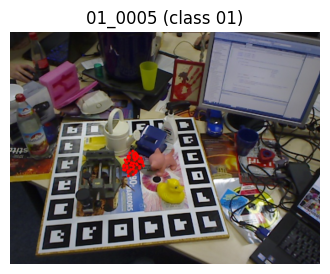

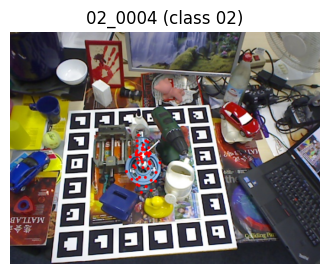

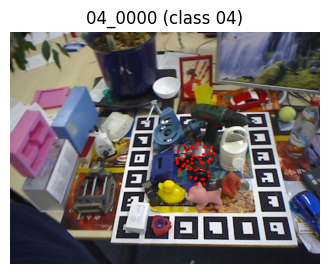

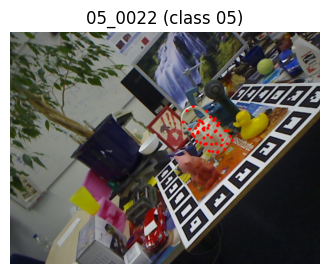

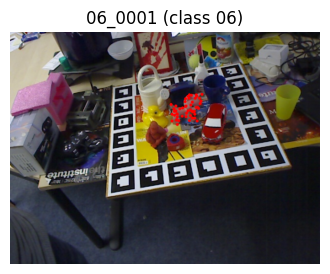

...

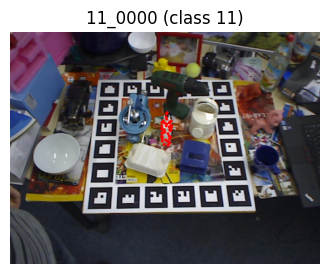

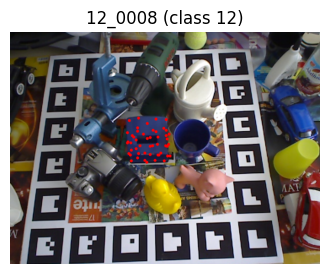

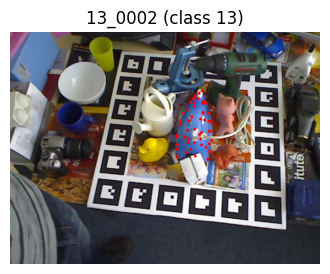

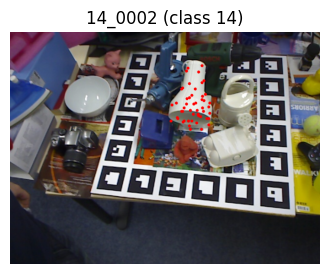

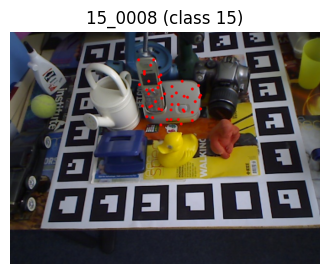

In [ ]:
visualize_one_per_class(
    keypoints_data=kp2d_fps,
    image_dir=IMG_DIR,
    gt_keypoints_data=GT_JSON,
    orig=True
)

# **PnP (Perspective-n-Point)**

Before applying the PnP algorithm, it is necessary to eliminate duplicate 2D keypoints, as multiple 3D points may project onto the same pixel due to heatmap resolution or rounding effects.

For the PnP algorithm to work correctly, we must ensure at least **4 unique 2D-3D pairs**, which is the minimum required for solving the pose estimation problem using `solvePnP`.

The function `eliminate_duplicate_pairs` is used to perform that step.



In [ ]:
def eliminate_duplicate_pairs(pts2d, pts3d):

  pairs = list(zip(pts3d, pts2d))
  unique_pairs = []
  seen_2d = set()

  for p3d, p2d in pairs:
      key = tuple(np.round(p2d))

      if key in seen_2d:
          continue

      seen_2d.add(key)
      unique_pairs.append((p3d, p2d))

  if len(unique_pairs) < 4:
      print(f"WARNING: Not enough unique 2D keypoints after deduplication")
      return None

  pts3d_clean = np.array([p3d for p3d, _ in unique_pairs], dtype=np.float64)
  pts2d_clean = np.array([p2d for _, p2d in unique_pairs], dtype=np.float64)

  return pts2d_clean, pts3d_clean


In [ ]:
# ─── CONSTANTS ─────────────────────────────────────────────────────────────────
K = np.array([
    [572.4114,   0.0,      325.2611],
    [  0.0,    573.57043,  242.04899],
    [  0.0,      0.0,        1.0   ]
], dtype=np.float64)

def run_pnp(item, kp3d):
  img_id, keypoints = item

  # Recover full‐image 2D keypoints
  transformed_keypoints = transfrom_keypoints(img_id, keypoints)

  # Select 3D model
  obj_key = img_id.split("_")[0]
  pts3d = np.array(kp3d[obj_key])
  pts2d = np.array(transformed_keypoints, np.float64)


  #Dedpulication step
  pts2d, pts3d = eliminate_duplicate_pairs(pts2d, pts3d)

  success, rvec, tvec, inliers = cv2.solvePnPRansac(
      objectPoints = pts3d,
      imagePoints = pts2d,
      cameraMatrix = K,
      distCoeffs = None,
      reprojectionError = 5,
      confidence = 0.99,  #
      flags = cv2.SOLVEPNP_ITERATIVE
  )


  if not success:
      print(f"WARNING: Solution could not be found under this reprojection error")
      return None

  R_mat, _ = cv2.Rodrigues(rvec)
  return img_id, {"R": R_mat.tolist(), "t": tvec.flatten().tolist()}, inliers

### **Parallel PnP Execution**

To speed up pose estimation, we run the PnP algorithm in parallel across all images using Python's `ProcessPoolExecutor`.
The `safe_run_pnp` wrapper ensures that errors in individual tasks do not interrupt the entire process.


In [ ]:
def safe_run_pnp(t, kp3d):
      try:
          return run_pnp(t, kp3d)
      except Exception as e:
          print(f"[ERROR] {t[0]}: {e}")
          return None

def run_parallel_pnp(kp, kp3d):

    tasks = list(kp.items())
    pnp_results_pred = {}
    skipped = 0

    with ProcessPoolExecutor() as executor:
        futures = {executor.submit(safe_run_pnp, t, kp3d): t for t in tasks}

        for future in tqdm(as_completed(futures), total=len(futures), desc="Running PnP"):
            result = future.result()
            if result is None:
                skipped += 1
            else:
                img_id, pose, inliers = result
                pnp_results_pred[img_id] = (pose, inliers)

    return pnp_results_pred, skipped

## **Execution of the PnP**


In [ ]:
#-------BASELINE--------

#CPS predictions
pnp_results_pred_cps, skipped_pred_cps = run_parallel_pnp(kp2d_cps, kp3d_cps)
print(f"\nTotal skipped for FPS baseline: {skipped_pred_cps}")

#FPS predictions
pnp_results_pred_fps, skipped_pred_fps = run_parallel_pnp(kp2d_fps, kp3d_fps)
print(f"\nTotal skipped for CPS baseline: {skipped_pred_fps}")

#-------EXTENDED----------

#CROSS FUSION RELU
pnp_results_pred_cross_fusion_relu, skipped_pred_cross_fusion_relu = run_parallel_pnp(kp2d_cross_fusion_relu, kp3d_fps)
print(f"\nTotal skipped for Cross Fusion + ReLU: {skipped_pred_cross_fusion_relu}")

#CROSS FUSION SILU
pnp_results_pred_cross_fusion_silu, skipped_pred_cross_fusion_silu = run_parallel_pnp(kp2d_cross_fusion_silu, kp3d_fps)
print(f"\nTotal skipped for Cross Fusion + SiLU: {skipped_pred_cross_fusion_silu}")

#CROSS FUSION MISH
pnp_results_pred_cross_fusion_mish, skipped_pred_cross_fusion_mish = run_parallel_pnp(kp2d_cross_fusion_mish, kp3d_fps)
print(f"\nTotal skipped for Cross Fusion + MiSH: {skipped_pred_cross_fusion_mish}")


# EXTENDED + SCHEDULLERS

#CROSS FUSION + RELU + COSINE
pnp_results_pred_cross_fusion_relu_cos, skipped_pred_cross_fusion_relu_cos = run_parallel_pnp(kp2d_cross_fusion_relu_cos, kp3d_fps)
print(f"\nTotal skipped for Cross Fusion + ReLU + cosine: {skipped_pred_cross_fusion_relu_cos}")

#CROSS FUSION + SILU + COSINE
pnp_results_pred_cross_fusion_silu_cos, skipped_pred_cross_fusion_silu_cos = run_parallel_pnp(kp2d_cross_fusion_silu_cos, kp3d_fps)
print(f"\nTotal skipped for Cross Fusion + SiLU + cosine: {skipped_pred_cross_fusion_silu_cos}")

#CROSS FUSION + MISH + COSINE
pnp_results_pred_cross_fusion_mish_cos, skipped_pred_cross_fusion_mish_cos = run_parallel_pnp(kp2d_cross_fusion_mish_cos, kp3d_fps)
print(f"\nTotal skipped for Cross Fusion + Mish + cosine: {skipped_pred_cross_fusion_mish_cos}")



#CROSS FUSION + RELU + POLY
pnp_results_pred_cross_fusion_relu_poly, skipped_pred_cross_fusion_relu_poly = run_parallel_pnp(kp2d_cross_fusion_relu_poly, kp3d_fps)
print(f"\nTotal skipped for Cross Fusion + Relu + poly: {skipped_pred_cross_fusion_relu_poly}")

#CROSS FUSION + SILU + POLY
pnp_results_pred_cross_fusion_silu_poly, skipped_pred_cross_fusion_silu_poly = run_parallel_pnp(kp2d_cross_fusion_silu_poly, kp3d_fps)
print(f"\nTotal skipped for Cross Fusion + SiLU + poly: {skipped_pred_cross_fusion_silu_poly}")

#CROSS FUSION + MISH + POLY
pnp_results_pred_cross_fusion_mish_poly, skipped_pred_cross_fusion_mish_poly = run_parallel_pnp(kp2d_cross_fusion_mish_poly, kp3d_fps)
print(f"\nTotal skipped for Cross Fusion + Mish + poly: {skipped_pred_cross_fusion_mish_poly}")

Running PnP: 100%|██████████| 2843/2843 [00:15<00:00, 184.62it/s]



Total skipped for FPS baseline: 0


Running PnP: 100%|██████████| 2843/2843 [00:15<00:00, 183.12it/s]


Total skipped for CPS baseline: 0



Running PnP: 100%|██████████| 2843/2843 [00:15<00:00, 180.20it/s]


Total skipped for Cross Fusion + ReLU: 0



Running PnP: 100%|██████████| 2843/2843 [00:16<00:00, 173.55it/s]


Total skipped for Cross Fusion + SiLU: 0



Running PnP: 100%|██████████| 2843/2843 [00:15<00:00, 184.85it/s]



Total skipped for Cross Fusion + MiSH: 0


Running PnP: 100%|██████████| 2843/2843 [00:14<00:00, 189.65it/s]



Total skipped for Cross Fusion + ReLU + cosine: 0


Running PnP: 100%|██████████| 2843/2843 [00:14<00:00, 196.03it/s]


Total skipped for Cross Fusion + SiLU + cosine: 0



Running PnP: 100%|██████████| 2843/2843 [00:15<00:00, 186.71it/s]


Total skipped for Cross Fusion + Mish + cosine: 0



Running PnP: 100%|██████████| 2843/2843 [00:15<00:00, 189.37it/s]


Total skipped for Cross Fusion + Relu + poly: 0



Running PnP: 100%|██████████| 2843/2843 [00:15<00:00, 188.16it/s]


Total skipped for Cross Fusion + SiLU + poly: 0



Running PnP: 100%|██████████| 2843/2843 [00:16<00:00, 175.40it/s]



Total skipped for Cross Fusion + Mish + poly: 0


# **Evaluating Results – Measuring ADD**

Before ADD evaluation, we define object diameters from provided file and specify symmetric objects (eggbox and glue) that require ADD-S metric.




In [ ]:
# ─── CONSTANTS ─────────────────────────────────────────────────────────────────

DIAMETER_MAP = {
    '01': 102.09865663,
    '02': 247.50624233,
    '03': 167.35486092,
    '04': 172.49224865,
    '05': 201.40358597,
    '06': 154.54551808,
    '07': 124.26430816,
    '08': 261.47178102,
    '09': 108.99920102,
    '10': 164.62758848,
    '11': 175.88933422,
    '12': 145.54287471,
    '13': 278.07811733,
    '14': 282.60129399,
    '15': 212.35825148
}

SYMMETRIC_OBJECTS = {'10', '11'}  #eggbox (10) and glue (11)

def get_gt_pose(img_id):
    entry = gt_data[img_id]
    R_list, t_list = entry[0], entry[1]
    R = np.array(R_list, float).reshape(3, 3)
    t = np.array(t_list, float).flatten().reshape(3, 1)
    return R, t


def evaluate_pose_estimation(pnp_results,
                             kp3d,
                             threshold_ratio=0.1):

    correct_by_class = defaultdict(int)
    total_by_class   = defaultdict(int)
    results_distribution_class = defaultdict(list)
    high_error_samples = defaultdict(list)


    for img_id, (est, _) in pnp_results.items():
        cls = img_id.split("_")[0]

        Rg, tg = get_gt_pose(img_id)

        Rp = np.array(est["R"], dtype=float)
        tp = np.array(est["t"], dtype=float).reshape(3, 1)

        # project keypoints
        pts3d = np.array(kp3d[cls], dtype=np.float32)
        gt_tr  = (Rg @ pts3d.T + tg).T
        pnp_tr = (Rp @ pts3d.T + tp).T


        if cls in SYMMETRIC_OBJECTS:

        # ADD-S: minimal distance between each GT point and closest predicted
          add_s_err = np.mean([
              np.min(np.linalg.norm(gt_point - pnp_tr, axis=1))
              for gt_point in gt_tr
          ])
          add_err = add_s_err
        else:
          # standard ADD
          add_err = np.mean(np.linalg.norm(gt_tr - pnp_tr, axis=1))

        total_by_class[cls] += 1

        results_distribution_class[cls].append(add_err/DIAMETER_MAP[cls])

        # print(add_err)
        if add_err < threshold_ratio * DIAMETER_MAP[cls]:
            correct_by_class[cls] += 1
        else:
            high_error_samples[cls].append((img_id, add_err))



    # compute accuracy percentages
    accuracy_results = {cls: 100.0 * correct_by_class[cls] / total_by_class[cls]
        for cls in total_by_class
    }

    #sorting bad results
    for cls in high_error_samples:
      high_error_samples[cls].sort(key=lambda x: x[1], reverse=True)

    return accuracy_results, results_distribution_class, high_error_samples

### **Final ADD Evaluation Results**

In [ ]:
#--------BASELINE--------

accurracy_cps, results_distribution_cps, high_error_samples_cps = evaluate_pose_estimation(pnp_results_pred_cps,
                                    kp3d_cps,
                                    threshold_ratio=0.1)

accurracy_fps, results_distribution_fps, high_error_samples_fps = evaluate_pose_estimation(pnp_results_pred_fps,
                                    kp3d_fps,
                                    threshold_ratio=0.1)

#--------EXTENDED--------


accurracy_cross_fusion_relu, results_distribution_cross_fusion_relu, high_error_samples_cross_fusion_relu = evaluate_pose_estimation(pnp_results_pred_cross_fusion_relu,
                                    kp3d_fps,
                                    threshold_ratio=0.1)

accurracy_cross_fusion_silu, results_distribution_cross_fusion_silu, high_error_samples_cross_fusion_silu = evaluate_pose_estimation(pnp_results_pred_cross_fusion_silu,
                                    kp3d_fps,
                                    threshold_ratio=0.1)

accurracy_cross_fusion_mish, results_distribution_cross_fusion_mish, high_error_samples_cross_fusion_mish = evaluate_pose_estimation(pnp_results_pred_cross_fusion_mish,
                                    kp3d_fps,
                                    threshold_ratio=0.1)


#--------EXTENDED + SCHEDULLERS--------


accurracy_cross_fusion_relu_cos, results_distribution_cross_fusion_relu_cos, high_error_samples_cross_fusion_relu_cos = evaluate_pose_estimation(pnp_results_pred_cross_fusion_relu_cos,
                                    kp3d_fps,
                                    threshold_ratio=0.1)

accurracy_cross_fusion_silu_cos, results_distribution_cross_fusion_silu_cos, high_error_samples_cross_fusion_silu_cos = evaluate_pose_estimation(pnp_results_pred_cross_fusion_silu_cos,
                                    kp3d_fps,
                                    threshold_ratio=0.1)

accurracy_cross_fusion_mish_cos, results_distribution_cross_fusion_mish_cos, high_error_samples_cross_fusion_mish_cos = evaluate_pose_estimation(pnp_results_pred_cross_fusion_mish_cos,
                                    kp3d_fps,
                                    threshold_ratio=0.1)



accurracy_cross_fusion_relu_poly, results_distribution_cross_fusion_relu_poly, high_error_samples_cross_fusion_relu_poly = evaluate_pose_estimation(pnp_results_pred_cross_fusion_relu_poly,
                                    kp3d_fps,
                                    threshold_ratio=0.1)

accurracy_cross_fusion_silu_poly, results_distribution_cross_fusion_silu_poly, high_error_samples_cross_fusion_silu_poly = evaluate_pose_estimation(pnp_results_pred_cross_fusion_silu_poly,
                                    kp3d_fps,
                                    threshold_ratio=0.1)

accurracy_cross_fusion_mish_poly, results_distribution_cross_fusion_mish_poly, high_error_samples_cross_fusion_mish_poly = evaluate_pose_estimation(pnp_results_pred_cross_fusion_mish_poly,
                                    kp3d_fps,
                                    threshold_ratio=0.1)



## SHOWING RESULTS


df_accuracy = pd.DataFrame({
    'Basline CPS': accurracy_cps,
    'Baseline FPS': accurracy_fps,
    'Cross-Fusion + ReLU': accurracy_cross_fusion_relu,
    'Cross-Fusion + Silu': accurracy_cross_fusion_silu,
    'Cross-Fusion + Mishu': accurracy_cross_fusion_mish,
    'Cross-Fusion + ReLU + cos':accurracy_cross_fusion_relu_cos,
    'Cross-Fusion + Silu + cos': accurracy_cross_fusion_silu_cos,
    'Cross-Fusion + Mish + cos': accurracy_cross_fusion_mish_cos,
    'Cross-Fusion + ReLU + poly': accurracy_cross_fusion_relu_poly,
    'Cross-Fusion + SiLU + poly': accurracy_cross_fusion_silu_poly,
    'Cross-Fusion + Mish + poly': accurracy_cross_fusion_mish_poly,

})

df_accuracy.loc['Mean'] = df_accuracy.mean()
df_accuracy

,Basline CPS,Baseline FPS,Cross-Fusion + ReLU,Cross-Fusion + Silu,Cross-Fusion + Mishu,Cross-Fusion + ReLU + cos,Cross-Fusion + Silu + cos,Cross-Fusion + Mish + cos,Cross-Fusion + ReLU + poly,Cross-Fusion + SiLU + poly,Cross-Fusion + Mish + poly
01,52.606635,61.137441,67.298578,60.189573,65.876777,72.037915,72.511848,72.037915,67.772512,64.928910,68.720379
02,93.181818,93.636364,96.363636,91.363636,94.545455,99.090909,95.454545,96.818182,95.454545,96.818182,95.454545
04,87.317073,89.268293,92.195122,87.317073,88.780488,95.121951,94.146341,95.609756,89.756098,91.219512,93.658537
05,91.964286,89.732143,91.517857,83.928571,90.625000,93.303571,95.089286,94.196429,89.732143,88.392857,87.946429
06,78.378378,81.981982,86.936937,74.324324,85.585586,86.936937,91.441441,90.990991,86.936937,83.783784,85.135135
08,95.454545,97.474747,96.969697,92.424242,96.464646,99.494949,97.474747,98.484848,96.969697,98.484848,97.474747
09,57.777778,66.666667,65.333333,62.666667,66.222222,66.222222,73.333333,79.111111,67.555556,65.777778,65.333333
10,81.578947,87.719298,82.894737,87.719298,90.350877,89.473684,92.543860,91.666667,87.719298,82.894737,85.087719
11,86.486486,91.441441,92.342342,89.639640,95.495495,94.144144,94.594595,95.945946,92.342342,90.540541,91.441441
12,85.581395,87.906977,87.906977,78.604651,88.372093,88.372093,90.232558,90.697674,83.720930,87.441860,83.255814


from matplotlib import pyplot as plt
df_accuracy['Basline CPS'].plot(kind='hist', bins=20, title='Basline CPS')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy['Baseline FPS'].plot(kind='hist', bins=20, title='Baseline FPS')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy['Cross-Fusion + ReLU'].plot(kind='hist', bins=20, title='Cross-Fusion + ReLU')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy['Cross-Fusion + Silu'].plot(kind='hist', bins=20, title='Cross-Fusion + Silu')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy.plot(kind='scatter', x='Basline CPS', y='Baseline FPS', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy.plot(kind='scatter', x='Baseline FPS', y='Cross-Fusion + ReLU', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy.plot(kind='scatter', x='Cross-Fusion + ReLU', y='Cross-Fusion + Silu', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy.plot(kind='scatter', x='Cross-Fusion + Silu', y='Cross-Fusion + Mishu', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy['Basline CPS'].plot(kind='line', figsize=(8, 4), title='Basline CPS')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy['Baseline FPS'].plot(kind='line', figsize=(8, 4), title='Baseline FPS')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy['Cross-Fusion + ReLU'].plot(kind='line', figsize=(8, 4), title='Cross-Fusion + ReLU')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_accuracy['Cross-Fusion + Silu'].plot(kind='line', figsize=(8, 4), title='Cross-Fusion + Silu')
plt.gca().spines[['top', 'right']].set_visible(False)

# **Analysis of results**

### **Plotting error distributions**

In [ ]:
def plot_add_distributions_side_by_side_5(distributions, cls, accuracies, labels, bins=35):

    fig, axes = plt.subplots(1, 5, figsize=(25, 5))

    for ax, errors, acc, label in zip(axes, distributions, accuracies, labels):
        n, bins_edges, patches = ax.hist(errors, bins=bins, color='skyblue', edgecolor='black')

        for count, patch in zip(n, patches):
            x = patch.get_x() + patch.get_width() / 2
            y = patch.get_height()
            if count > 0:
                ax.text(x, y + 0.5, f"{int(count)}", ha='center', va='bottom', fontsize=8)

        ax.set_title(f"{label}\nAccuracy: {acc:.2f}%")
        ax.set_xlabel("ADD error (%)")
        ax.set_ylabel("Count")
        ax.grid(True)

    plt.suptitle(f"ADD Error Distributions – Class {cls}", fontsize=16)
    plt.tight_layout()
    plt.show()


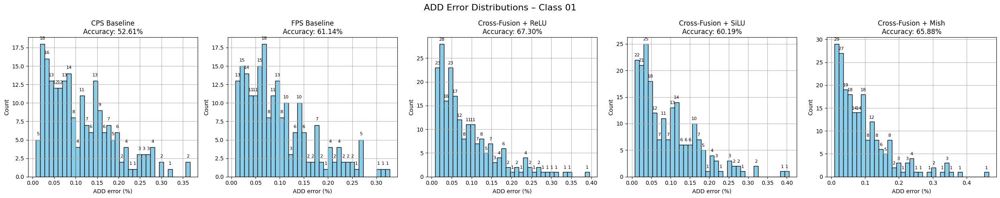

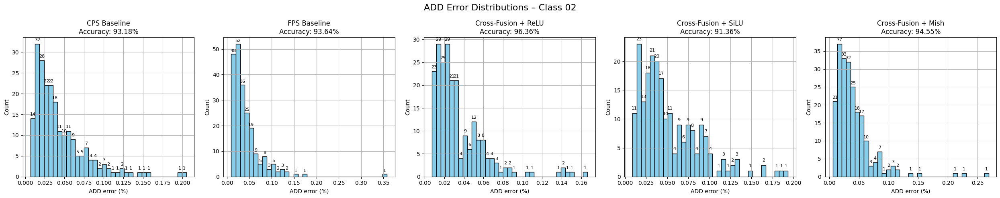

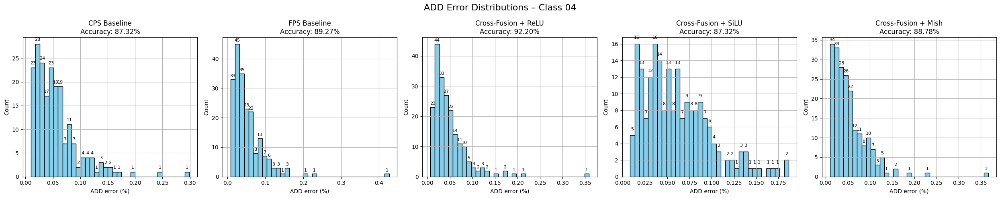

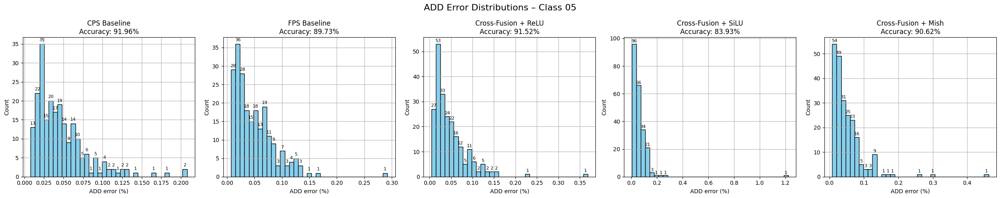

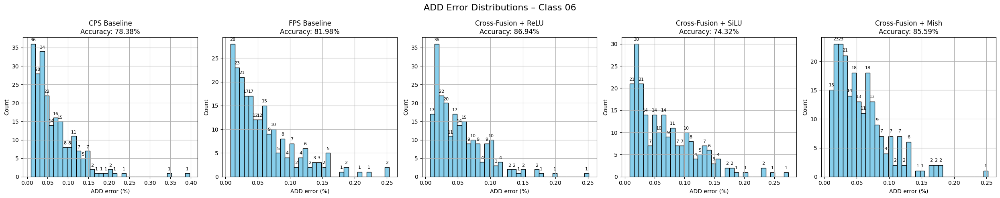

...

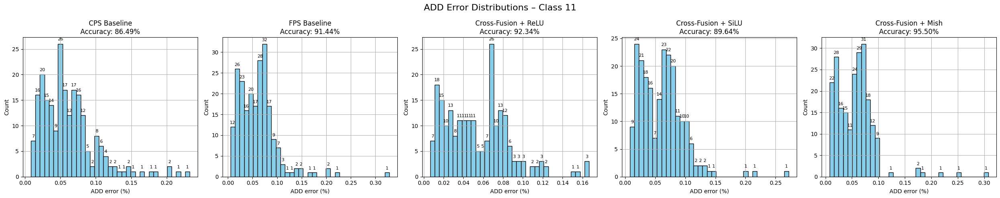

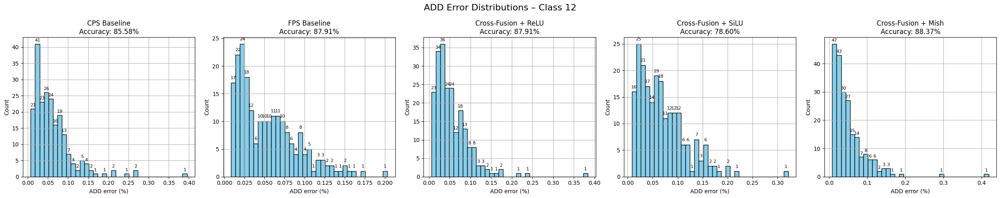

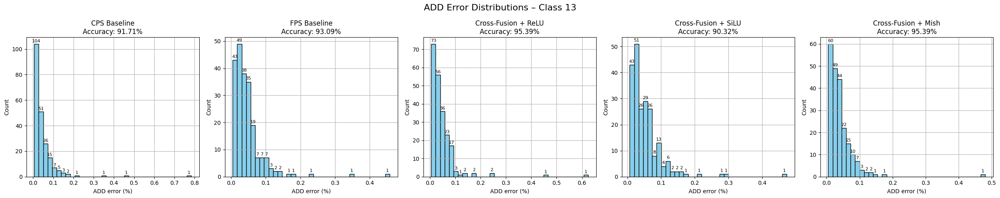

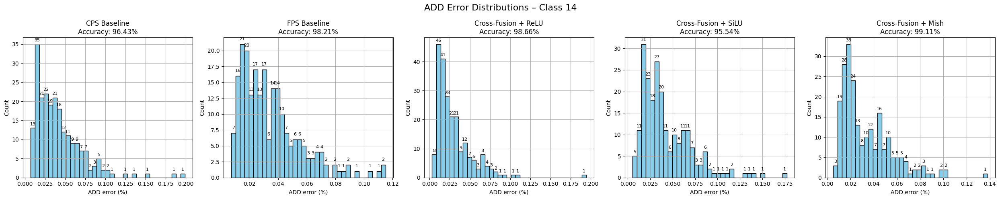

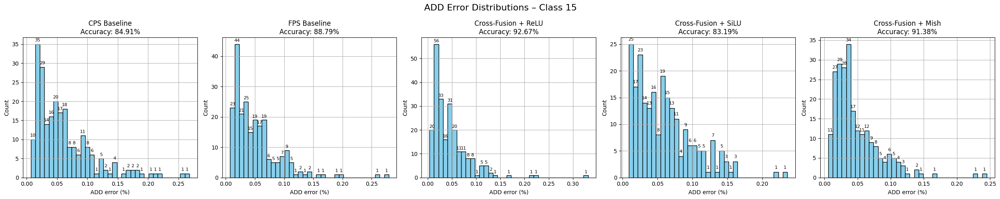

In [ ]:
for cls in kp3d_cps.keys():
    plot_add_distributions_side_by_side_5(
        distributions=[
            results_distribution_cps[cls],
            results_distribution_fps[cls],
            results_distribution_cross_fusion_relu[cls],
            results_distribution_cross_fusion_silu[cls],
            results_distribution_cross_fusion_mish[cls]
        ],
        cls=cls,
        accuracies=[
            accurracy_cps[cls],
            accurracy_fps[cls],
            accurracy_cross_fusion_relu[cls],
            accurracy_cross_fusion_silu[cls],
            accurracy_cross_fusion_mish[cls]
        ],
        labels=[
            "CPS Baseline",
            "FPS Baseline",
            "Cross-Fusion + ReLU",
            "Cross-Fusion + SiLU",
            "Cross-Fusion + Mish"
        ]
    )


### **Plotting error CDF curves**

In [ ]:
def plot_add_cdf_combined(cdf_data, cls, labels, colors=None):

    if colors is None:
        colors = ['blue', 'green', 'orange', 'purple', 'brown']

    plt.figure(figsize=(10, 6))

    for errors, label, color in zip(cdf_data, labels, colors):

        sorted_errors = np.sort(errors)
        cumulative = np.arange(1, len(sorted_errors) + 1) / len(sorted_errors)

        acc_at_threshold = np.sum(sorted_errors < 0.1) / len(sorted_errors) * 100

        plt.plot(sorted_errors, cumulative, color=color, lw=2,
                 label=f"{label} ({acc_at_threshold:.2f}% under 0.1)")

    plt.axvline(x=0.1, color='red', linestyle='--', label='Threshold = 0.1')

    plt.xlabel("ADD threshold (w.r.t. object diameter)")
    plt.ylabel("Cumulative Distribution")
    plt.title(f"CDF Comparison – Class {cls}")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


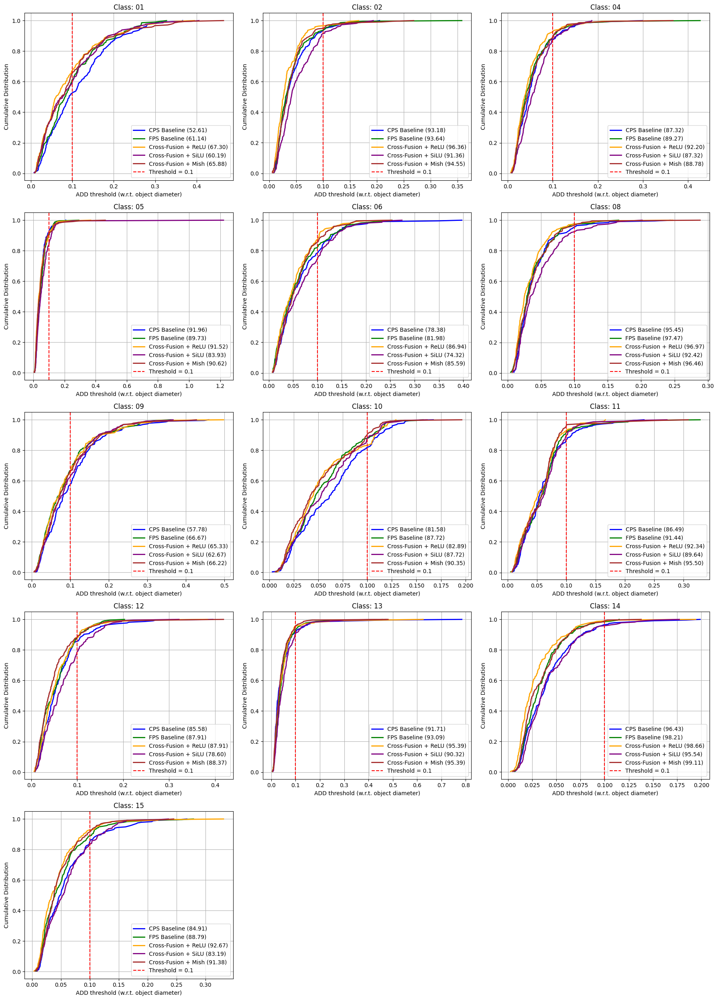

In [ ]:
def plot_add_cdf_combined(cdf_data, cls, labels, ax, colors=None):

    if colors is None:
        colors = ['blue', 'green', 'orange', 'purple', 'brown']

    for errors, label, color in zip(cdf_data, labels, colors):
        sorted_errors = np.sort(errors)
        cumulative = np.arange(1, len(sorted_errors) + 1) / len(sorted_errors)

        acc_at_threshold = np.sum(sorted_errors < 0.1) / len(sorted_errors) * 100

        ax.plot(sorted_errors, cumulative, color=color, lw=2,
                label=f"{label} ({acc_at_threshold:.2f})")

    ax.axvline(x=0.1, color='red', linestyle='--', label='Threshold = 0.1')

    ax.set_xlabel("ADD threshold (w.r.t. object diameter)")
    ax.set_ylabel("Cumulative Distribution")
    ax.set_title(f"Class: {cls}")
    ax.grid(True)
    ax.legend()

num_classes = len(kp3d_cps)
cols = 3
rows = int(np.ceil(num_classes / cols))
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()

for idx, cls in enumerate(kp3d_cps.keys()):
    plot_add_cdf_combined(
        cdf_data=[
            results_distribution_cps[cls],
            results_distribution_fps[cls],
            results_distribution_cross_fusion_relu[cls],
            results_distribution_cross_fusion_silu[cls],
            results_distribution_cross_fusion_mish[cls]
        ],
        cls=cls,
        labels=[
            "CPS Baseline",
            "FPS Baseline",
            "Cross-Fusion + ReLU",
            "Cross-Fusion + SiLU",
            "Cross-Fusion + Mish"
        ],
        ax=axes[idx]
    )

for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### **Observations:**


### **Histograms Interpretation**

The histograms show the distribution of ADD errors for different models across object classes. All distributions are right-skewed, indicating that most predictions have low error, while a smaller portion of samples contributes to larger errors.

Advanced configurations with Cross-Fusion layers (ReLU, Mish) show clear improvements, with error distributions shifting to the left and higher concentrations of samples achieving lower ADD errors, which correlates with increased overall accuracy.



### **CDF Curves Interpretation**

For some classes, especially **10**, **11**, and **15**, increasing the ADD threshold by just 0.01 or 0.02 would significantly improve the reported accuracy. This indicates that many predictions are near the threshold boundary.

Additionally, it is observed that with the inclusion of depth information, most configurations achieved an overall improvement by shifting the ADD threshold performance higher — with the exception of the SiLU activation, which did not consistently follow this trend.


The weakest results are observed for **Class 01 (ape)** and **Class 09 (duck)**, where both the overall accuracy remains low, and the CDF curves grow more slowly, which is expected, as these objects are known to be particularly challenging within the LINEMOD dataset due to their shape and visual properties.


## **Plotting pose predictions**

For visual purposes, we plot one example per class with high ADD error to better illustrate typical failure cases and analyze where the predicted 6D pose significantly deviates from the ground truth.

In particular, we first visualize the worst-performing samples based on the results from the RGB-only predictions. For each of these cases, we additionally plot the corresponding depth-based predictions to observe the influence of depth information and identify potential causes for performance improvement or failure.

In [ ]:
# ----- CONSTANTS ------
BBOXES = {
    '01': {'min_x': -37.9343, 'min_y': -38.7996, 'min_z': -45.8845, 'size_x': 75.8686, 'size_y': 77.5992, 'size_z': 91.769},
    '02': {'min_x': -107.835, 'min_y': -60.9279, 'min_z': -109.705, 'size_x': 215.67, 'size_y': 121.8557, 'size_z': 219.41},
    '04': {'min_x': -68.3297, 'min_y': -71.5151, 'min_z': -50.2485, 'size_x': 136.6594, 'size_y': 143.0302, 'size_z': 100.497},
    '05': {'min_x': -50.3958, 'min_y': -90.8979, 'min_z': -96.867, 'size_x': 100.7916, 'size_y': 181.7958, 'size_z': 193.734},
    '06': {'min_x': -33.5054, 'min_y': -63.8165, 'min_z': -58.7283, 'size_x': 67.0107, 'size_y': 127.633, 'size_z': 117.4566},
    '08': {'min_x': -114.738, 'min_y': -37.7357, 'min_z': -104.001, 'size_x': 229.476, 'size_y': 75.4714, 'size_z': 208.002},
    '09': {'min_x': -52.2146, 'min_y': -38.7038, 'min_z': -42.8485, 'size_x': 104.4292, 'size_y': 77.4076, 'size_z': 85.697},
    '10': {'min_x': -75.0923, 'min_y': -53.5375, 'min_z': -34.6207, 'size_x': 150.1846, 'size_y': 107.075, 'size_z': 69.2414},
    '11': {'min_x': -18.3605, 'min_y': -38.933, 'min_z': -86.4079, 'size_x': 36.7211, 'size_y': 77.866, 'size_z': 172.8158},
    '12': {'min_x': -50.4439, 'min_y': -54.2485, 'min_z': -45.4, 'size_x': 100.8878, 'size_y': 108.497, 'size_z': 90.8},
    '13': {'min_x': -129.113, 'min_y': -59.241, 'min_z': -70.5662, 'size_x': 258.226, 'size_y': 118.4821, 'size_z': 141.1324},
    '14': {'min_x': -101.573, 'min_y': -58.8763, 'min_z': -106.558, 'size_x': 203.146, 'size_y': 117.7525, 'size_z': 213.116},
    '15': {'min_x': -46.9591, 'min_y': -73.7167, 'min_z': -92.3737, 'size_x': 93.9181, 'size_y': 147.4334, 'size_z': 184.7474}
}

K = np.array([
    [572.4114,   0.0,      325.2611],
    [  0.0,    573.57043,  242.04899],
    [  0.0,      0.0,        1.0   ]
], dtype=np.float64)

COLOR_PRED = (0, 255, 0)
COLOR_GT = (255, 0, 0)


# ------ UTILITY FUNCTIONS ------

def get_bbox_points(bbox):
  x, y, z = bbox['min_x'], bbox['min_y'], bbox['min_z']
  dx, dy, dz = bbox['size_x'], bbox['size_y'], bbox['size_z']
  return np.array([
      [x,     y,     z],
      [x+dx,  y,     z],
      [x+dx,  y+dy,  z],
      [x,     y+dy,  z],
      [x,     y,     z+dz],
      [x+dx,  y,     z+dz],
      [x+dx,  y+dy,  z+dz],
      [x,     y+dy,  z+dz]
  ], dtype=np.float32)


def draw_bbox(img, pts, color=(0, 255, 0)):
  pts = pts.astype(int)
  for i, j in zip([0,1,2,3], [1,2,3,0]):
      cv2.line(img, pts[i], pts[j], color, 2)
  for i, j in zip([4,5,6,7], [5,6,7,4]):
      cv2.line(img, pts[i], pts[j], color, 2)
  for i, j in zip(range(4), range(4, 8)):
      cv2.line(img, pts[i], pts[j], color, 2)


In [ ]:
def visualize_6d_pose_with_errors_dual(img_id, pose_data_rgb, pose_data_depth, cls):

    bbox = BBOXES[cls]
    points_3d = get_bbox_points(bbox)

    # === Ground Truth ===
    R_gt, t_gt = get_gt_pose(img_id)
    rvec_gt, _ = cv2.Rodrigues(R_gt)
    points_2d_gt, _ = cv2.projectPoints(points_3d, rvec_gt, t_gt, K, None)
    points_2d_gt = points_2d_gt.squeeze()

    pts3d = np.array(kp3d_fps[cls], dtype=np.float32)
    gt_transformed = (R_gt @ pts3d.T + t_gt).T

    # === Prediction RGB ===
    R_pred_rgb = np.array(pose_data_rgb['R'], dtype=np.float32)
    t_pred_rgb = np.array(pose_data_rgb['t'], dtype=np.float32).reshape(3, 1)
    rvec_pred_rgb, _ = cv2.Rodrigues(R_pred_rgb)
    points_2d_pred_rgb, _ = cv2.projectPoints(points_3d, rvec_pred_rgb, t_pred_rgb, K, None)
    points_2d_pred_rgb = points_2d_pred_rgb.squeeze()

    pred_transformed_rgb = (R_pred_rgb @ pts3d.T + t_pred_rgb).T

    if cls in SYMMETRIC_OBJECTS:
        add_rgb = np.mean([
            np.min(np.linalg.norm(gt_point - pred_transformed_rgb, axis=1))
            for gt_point in gt_transformed
        ])
        label_rgb = "ADD-S"
    else:
        add_rgb = np.mean(np.linalg.norm(gt_transformed - pred_transformed_rgb, axis=1))
        label_rgb = "ADD"

    add_rgb_percent = 100 * add_rgb / DIAMETER_MAP[cls]
    translation_err_rgb = np.linalg.norm(t_gt - t_pred_rgb)
    R_diff_rgb = R_gt @ R_pred_rgb.T
    cos_theta_rgb = (np.trace(R_diff_rgb) - 1) / 2
    cos_theta_rgb = np.clip(cos_theta_rgb, -1.0, 1.0)
    rot_err_deg_rgb = np.degrees(np.arccos(cos_theta_rgb))

    # === Prediction Depth ===
    R_pred_depth = np.array(pose_data_depth['R'], dtype=np.float32)
    t_pred_depth = np.array(pose_data_depth['t'], dtype=np.float32).reshape(3, 1)
    rvec_pred_depth, _ = cv2.Rodrigues(R_pred_depth)
    points_2d_pred_depth, _ = cv2.projectPoints(points_3d, rvec_pred_depth, t_pred_depth, K, None)
    points_2d_pred_depth = points_2d_pred_depth.squeeze()

    pred_transformed_depth = (R_pred_depth @ pts3d.T + t_pred_depth).T

    if cls in SYMMETRIC_OBJECTS:
        add_depth = np.mean([
            np.min(np.linalg.norm(gt_point - pred_transformed_depth, axis=1))
            for gt_point in gt_transformed
        ])
        label_depth = "ADD-S"
    else:
        add_depth = np.mean(np.linalg.norm(gt_transformed - pred_transformed_depth, axis=1))
        label_depth = "ADD"

    add_depth_percent = 100 * add_depth / DIAMETER_MAP[cls]
    translation_err_depth = np.linalg.norm(t_gt - t_pred_depth)
    R_diff_depth = R_gt @ R_pred_depth.T
    cos_theta_depth = (np.trace(R_diff_depth) - 1) / 2
    cos_theta_depth = np.clip(cos_theta_depth, -1.0, 1.0)
    rot_err_deg_depth = np.degrees(np.arccos(cos_theta_depth))

    # === Load image ===
    img_path = os.path.join(IMG_DIR, f"{img_id}.png")
    img = cv2.imread(img_path)
    if img is None:
        print(f"[ERROR] Image not found: {img_path}")
        return

    img_rgb_only = img.copy()
    img_depth = img.copy()

    # === Draw RGB Prediction ===
    draw_bbox(img_rgb_only, points_2d_pred_rgb, color=COLOR_PRED)
    draw_bbox(img_rgb_only, points_2d_gt, color=COLOR_GT)
    cv2.putText(img_rgb_only, f"{label_rgb}: {add_rgb_percent:.2f}%", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2, cv2.LINE_AA)
    cv2.putText(img_rgb_only, f"Trans: {translation_err_rgb:.2f}mm", (10, 60),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2, cv2.LINE_AA)
    cv2.putText(img_rgb_only, f"Rot: {rot_err_deg_rgb:.2f} deg", (10, 90),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2, cv2.LINE_AA)

    # === Draw Depth Prediction ===
    draw_bbox(img_depth, points_2d_pred_depth, color=COLOR_PRED)
    draw_bbox(img_depth, points_2d_gt, color=COLOR_GT)
    cv2.putText(img_depth, f"{label_depth}: {add_depth_percent:.2f}%", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2, cv2.LINE_AA)
    cv2.putText(img_depth, f"Trans: {translation_err_depth:.2f}mm", (10, 60),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2, cv2.LINE_AA)
    cv2.putText(img_depth, f"Rot: {rot_err_deg_depth:.2f} deg", (10, 90),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2, cv2.LINE_AA)

    # === Show both images ===
    fig, axes = plt.subplots(1, 2, figsize=(15, 7))

    # Left - RGB
    axes[0].imshow(cv2.cvtColor(img_rgb_only, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"RGB-Only Prediction - {img_id}")
    legend_elements = [
        Line2D([0], [0], color='green', lw=2, label='Predicted BBox'),
        Line2D([0], [0], color='blue', lw=2, label='Ground Truth BBox')
    ]
    axes[0].legend(handles=legend_elements, loc='upper right')
    axes[0].axis("off")

    # Right - Depth
    axes[1].imshow(cv2.cvtColor(img_depth, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"Depth-Based Prediction - {img_id}")
    axes[1].legend(handles=legend_elements, loc='upper right')
    axes[1].axis("off")

    plt.show()


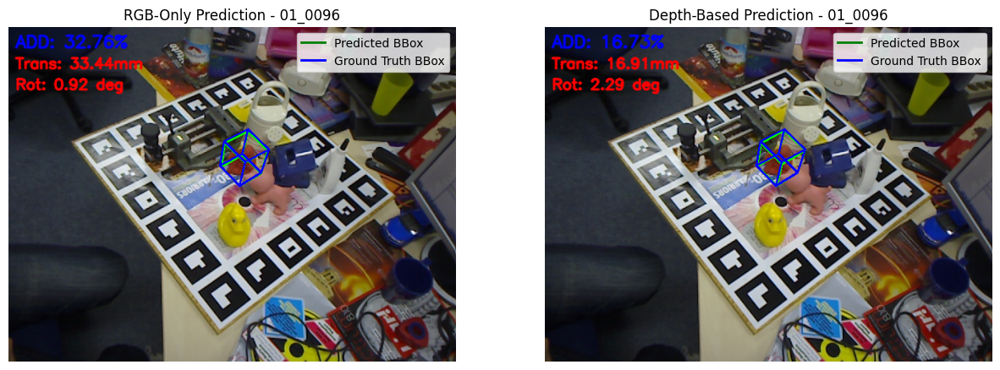

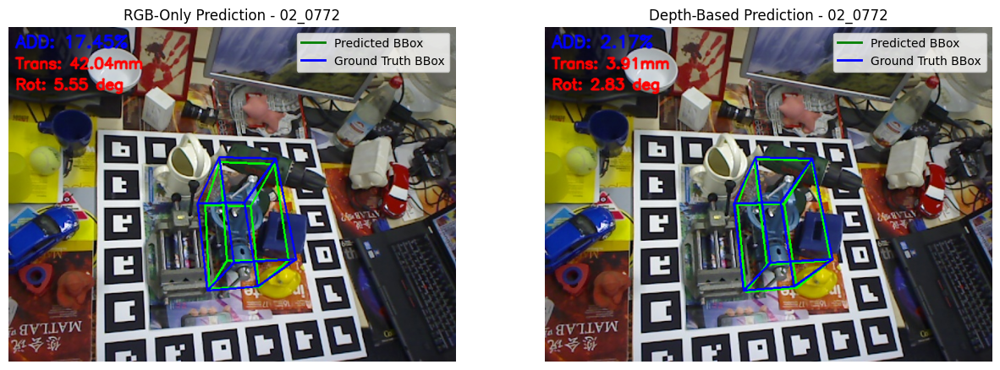

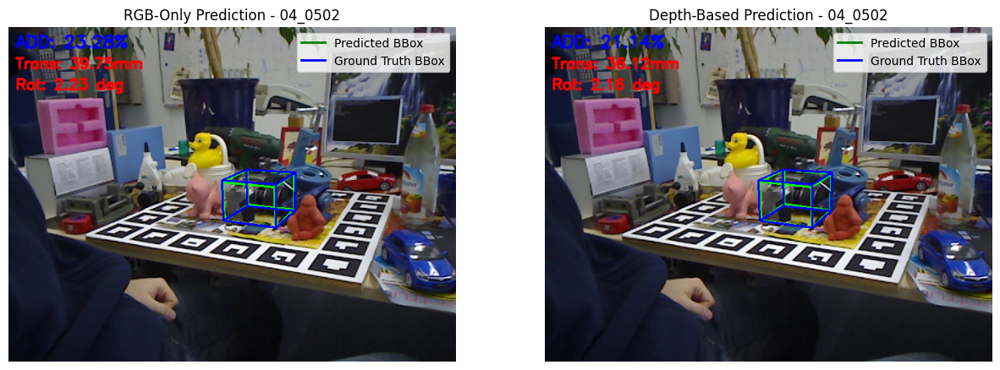

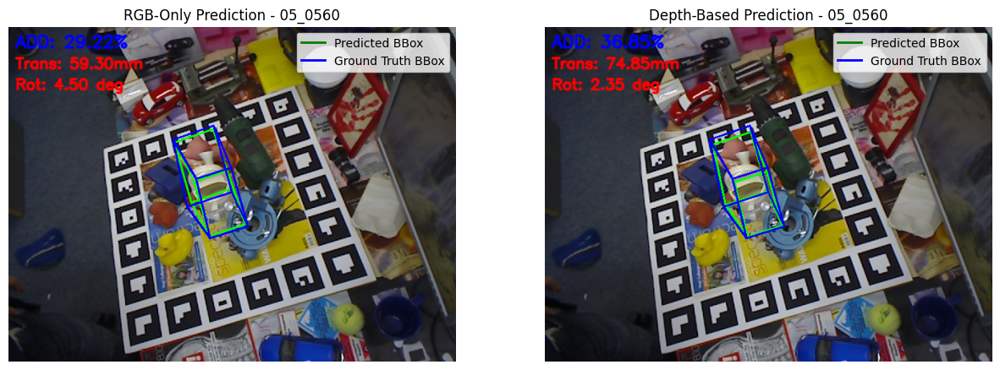

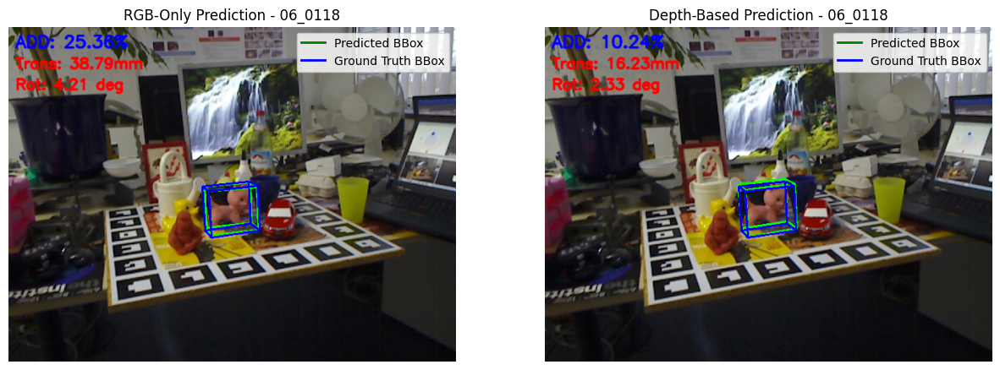

...

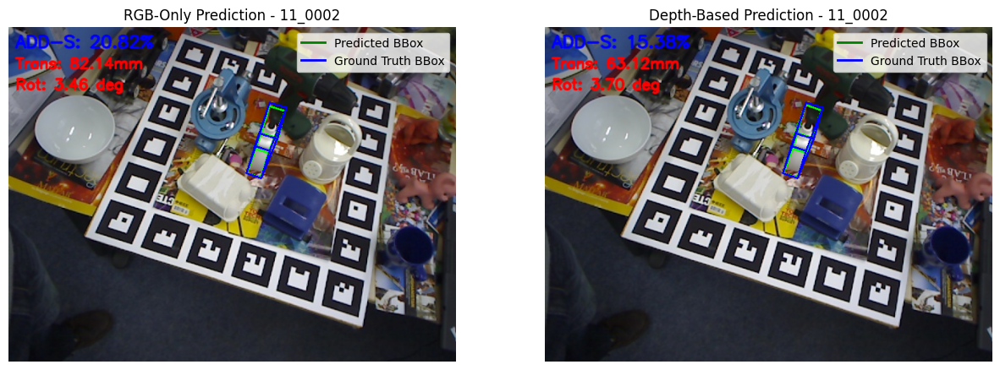

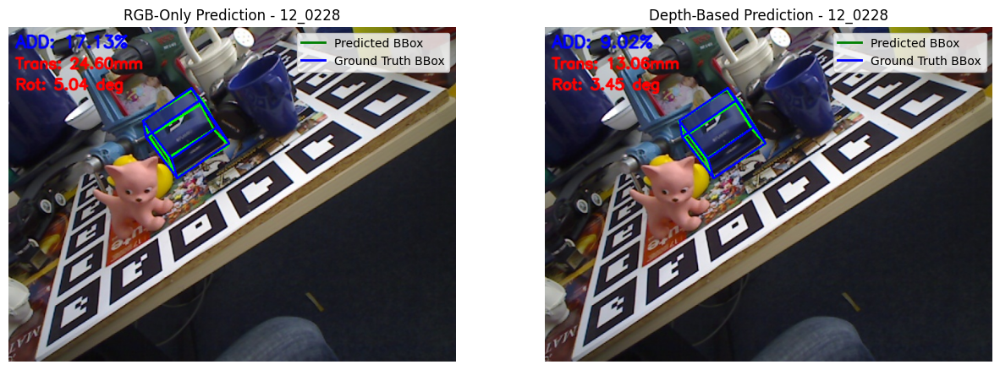

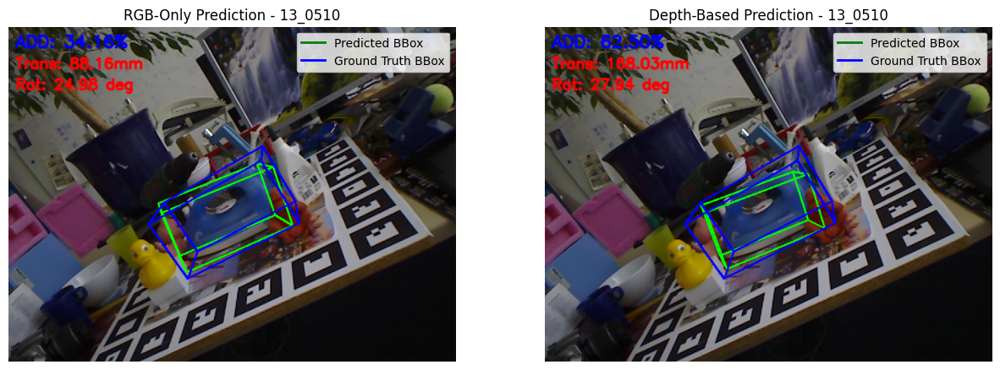

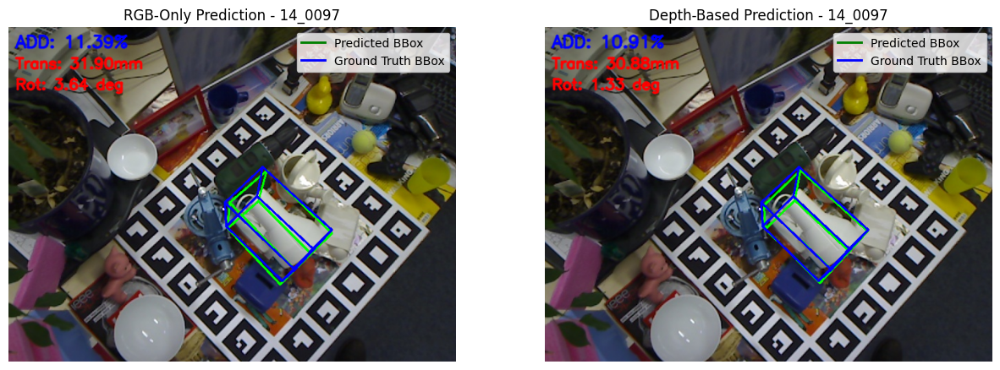

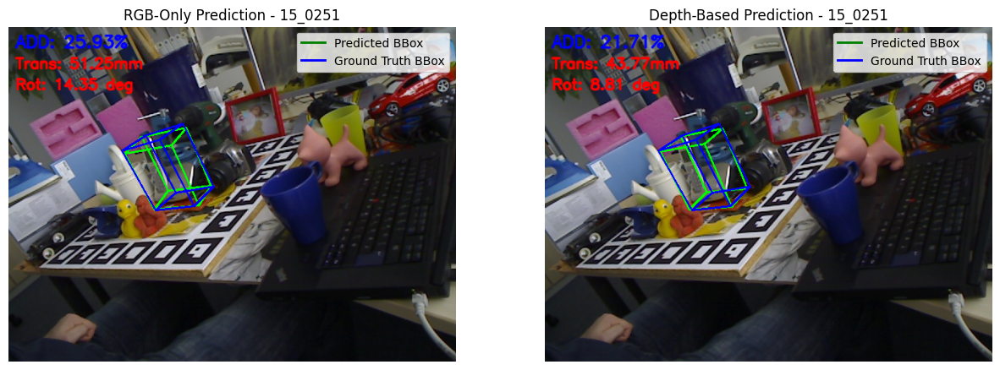

In [ ]:
plotted_classes = set()
plotted_ids = []

for img_id, (pose_data_rgb, inliers) in pnp_results_pred_fps.items():

    cls = img_id.split('_')[0]

    # Show only top-3 high error samples per class
    if img_id not in np.array(high_error_samples_fps[cls])[:3, 0]:
        continue

    if cls in plotted_classes:
        continue  # Already displayed one example for this class

    if img_id not in pnp_results_pred_cross_fusion_relu:
        print(f"[WARNING] No depth-based prediction for {img_id}")
        continue

    pose_data_depth = pnp_results_pred_cross_fusion_relu[img_id][0]  # (pose_data, inliers)

    visualize_6d_pose_with_errors_dual(img_id, pose_data_rgb, pose_data_depth, cls)

    plotted_ids.append(img_id)
    plotted_classes.add(cls)


## Observations:


We can observe that depth information brings the most significant improvements in cases with elevated viewpoints and in clear scenes without occlusions, as seen in examples 01, 02, 06, 08, 10, 11, and 14. In such scenarios, depth helps refine the 3D localization, leading to noticeably better pose estimation compared to RGB-only predictions.

On the other hand, in the presence of visible occlusions combined with challenging object textures, depth can even worsen the results. This is likely due to error propagation through both depth and RGB channels, introducing compounded inaccuracies. Such behavior is evident in examples 09 and 13, where depth fails to provide reliable geometric cues and instead amplifies pose estimation errors.

Overall, even small partial occlusions appear to be a consistent limitation for both RGB-only and depth-based approaches.
